# Setup

In [1]:
import librosa
import time
import numpy as np
import tensorflow as tf
import IPython
import IPython.display as ipd 
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from keras.optimizers import Adam

%matplotlib inline
matplotlib.style.use('ggplot')

2023-02-11 23:40:12.926429: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
from audioGan import *
from ganSetup import *
from ganModels import *

In [3]:
USE_GPU = True

if USE_GPU:
    device = '/device:GPU:0'
else:
    device = '/cpu:0'
    
print('Using device: ', device)

Using device:  /device:GPU:0


# Freesound Database

In [4]:
train = pd.read_csv(DATASET_PATH + "train.csv")
#train = pd.read_csv(DATASET_PATH+ "cv-valid-train.csv")
test  = pd.read_csv(DATASET_PATH + "sample_submission.csv")
#test = pd.read_csv(DATASET_PATH+"cv-valid-test.csv")
#print(train.label.unique())
print(train.columns.unique())

Index(['fname', 'label', 'manually_verified'], dtype='object')


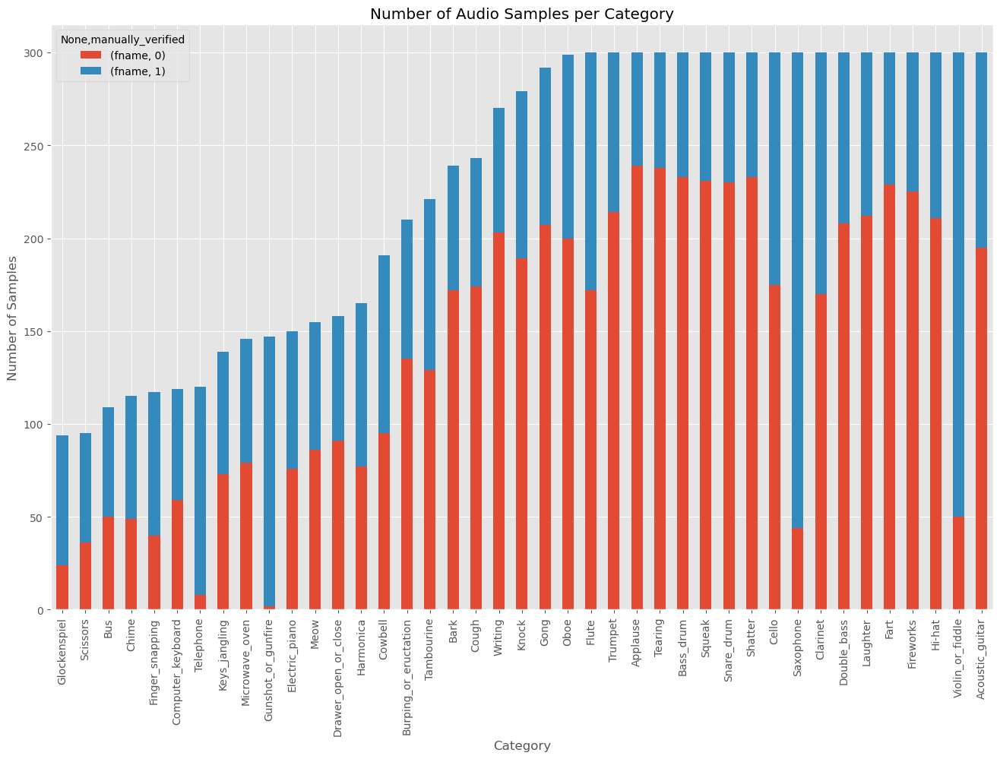

In [5]:
category_group = train.groupby(['label', 'manually_verified']).count()
#category_group = train.groupby(['gender', 'accent']).count()
plot = category_group.unstack().reindex(category_group.unstack().sum(axis=1).sort_values().index)\
          .plot(kind='bar', stacked=True, title="Number of Audio Samples per Category", figsize=(16,10))
plot.set_xlabel("Category")
plot.set_ylabel("Number of Samples");

Total samples (frames) =  (224000,)
[ 1.6097589e-04  2.7268848e-06 -7.6258910e-04 ... -4.2533535e-05
 -4.3978289e-05  8.9803571e-06]


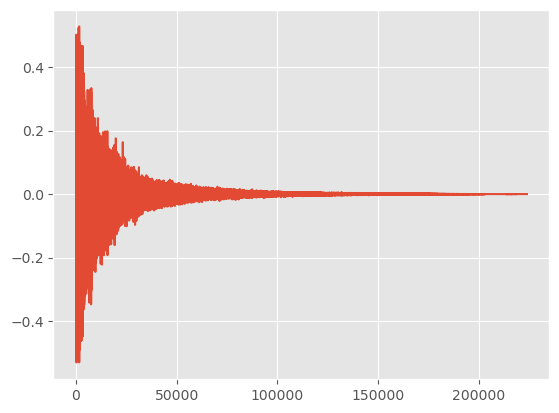

In [6]:
#fname = "../../Datasets/freesound-audio-tagging/audio_train/" + "00044347.wav"   # Hi-hat
fname = "/Users/surendrasrinivas/Downloads/B.TECH/SEMESTER 6/temp/FSDKaggle2018.audio_train/"+"00044347.wav"
#fname = "/Users/surendrasrinivas/Downloads/B.TECH/SEMESTER 6/temp/Audio_Generation/Datasets/common_voice_en_34925857.mp3"
data, _ = librosa.core.load(fname, sr=SAMPLE_RATE, res_type='kaiser_fast')
print("Total samples (frames) = ", data.shape)
print(data)
IPython.display.display(ipd.Audio(filename=fname))
plt.plot(data, '-', )
plt.show()

Shape:  (40, 63)


/var/folders/gm/_tj8v1xn1_ndf3txhmlbywh00000gn/T/ipykernel_27365/3543318939.py:2: FutureWarning: Pass y=[ 1.6097589e-04  2.7268848e-06 -7.6258910e-04 ...  3.0180828e-03
  3.0518265e-02  1.6102195e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mfcc = librosa.feature.mfcc(data, sr = SAMPLE_RATE, n_mfcc=40)


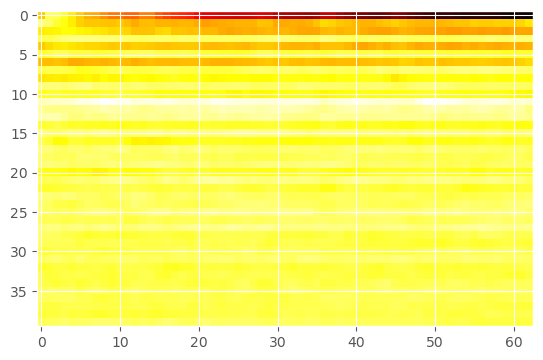

In [7]:
data = data[:2*SAMPLE_RATE]
mfcc = librosa.feature.mfcc(data, sr = SAMPLE_RATE, n_mfcc=40)
print("Shape: ", mfcc.shape)
plt.imshow(mfcc, cmap='hot', interpolation='nearest');

# GAN Architecture

### Discriminator

In [8]:
d = discriminator(AUDIO_SHAPE)
d.summary()

2023-02-11 23:40:18.230593: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape (Reshape)           (None, 64000, 1)          0         
                                                                 
 conv1d (Conv1D)             (None, 9129, 32)          3232      
                                                                 
 re_lu (ReLU)                (None, 9129, 32)          0         
                                                                 
 average_pooling1d (AverageP  (None, 2282, 32)         0         
 ooling1D)                                                       
                                                                 
 batch_normalization (BatchN  (None, 2282, 32)         128       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 2282, 32)          0

### Generator

In [9]:
g = generator(NOISE_DIM, AUDIO_SHAPE)
g.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 1000)              501000    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 1000)              0         
                                                                 
 batch_normalization_4 (Batc  (None, 1000)             4000      
 hNormalization)                                                 
                                                                 
 reshape_1 (Reshape)         (None, 1000, 1)           0         
                                                                 
 conv1d_3 (Conv1D)           (None, 1000, 16)          336       
                                                                 
 re_lu_3 (ReLU)              (None, 1000, 16)          0         
                                                      

### Stacked Generator and Discriminator

In [10]:
s = stacked_G_D(g,d)
s.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 64000)             1030744   
                                                                 
 sequential (Sequential)     (None, 1)                 1193497   
                                                                 
Total params: 2,224,241
Trainable params: 2,219,857
Non-trainable params: 4,384
_________________________________________________________________


### Autoencoder

In [11]:
e = encoder(AUDIO_SHAPE, ENCODE_SIZE)
a = autoEncoder(e, g)
a.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_3 (Sequential)   (None, 500)               2424780   
                                                                 
 sequential_1 (Sequential)   (None, 64000)             1030744   
                                                                 
Total params: 3,455,524
Trainable params: 3,453,188
Non-trainable params: 2,336
_________________________________________________________________


# Audio GAN 

In [12]:
myGan = AudioGAN(label = LABEL)

/Users/surendrasrinivas/opt/anaconda3/envs/TRINIT/lib/python3.10/site-packages/keras/optimizers/optimizer_v2/adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Data Loaded...
Data Normalized...


### Running Autoencoder

In [13]:
start = time.time()
myGan.train_autoencoder(epochs = 10, save_internal = 2, batch = 32)
end = time.time()
total = round(end - start, 2)
print("\nExecution Time: ", total, "s")

Epoch:  0 , Loss:  [2.835948944091797, 0.0]
Epoch:  2 , Loss:  [1.9003145694732666, 0.0]
Epoch:  4 , Loss:  [2.7970969676971436, 0.0]
Epoch:  6 , Loss:  [1.368620753288269, 0.0]
Epoch:  8 , Loss:  [2.1591010093688965, 0.0]

Execution Time:  12.31 s


Original:


1/1 [==============================] - 0s 272ms/step
Result:


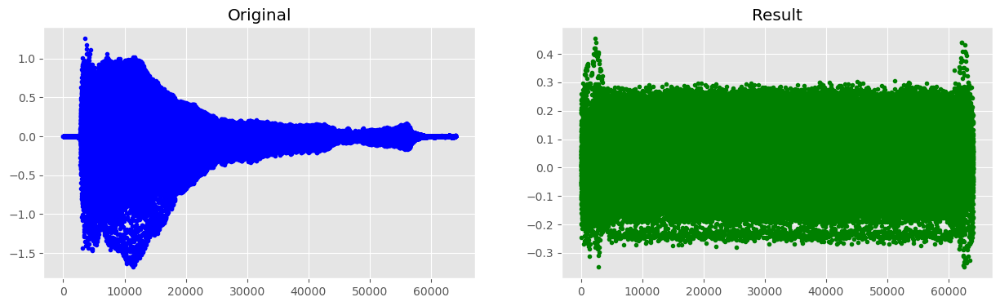

In [14]:
import soundfile as sf
INDEX = 11
#INDEX = 12
sample = myGan.trainData[INDEX]

print("Original:")
IPython.display.display(ipd.Audio(data = sample, rate = SAMPLE_RATE))
#sf.write(AUTO_ENCODER_PATH + "AE_Original_" + LABEL + ".wav", y = sample, sr = SAMPLE_RATE , norm = True)
#sf.write(AUTO_ENCODER_PATH + "AE_Original_" + LABEL + ".wav", sample, SAMPLE_RATE)
sf.write("Datasets/WavFiles/Autoencoder/violin_or_fiddle.wav", sample, SAMPLE_RATE)
#librosa.output.write_wav(AUTO_ENCODER_PATH + "AE_Original_" + LABEL + ".wav", y = sample, sr = SAMPLE_RATE , norm = True)
result = myGan.autoencoder.predict(sample.reshape((1,AUDIO_SHAPE))).flatten()

print("Result:")
IPython.display.display(ipd.Audio(data = result, rate = SAMPLE_RATE))
#sf.write(AUTO_ENCODER_PATH + "AE_Result_" + LABEL + ".wav", y = result, sr = SAMPLE_RATE , norm = True)
sf.write(AUTO_ENCODER_PATH + "AE_Result_" + LABEL + ".wav", sample, SAMPLE_RATE)
#librosa.output.write_wav(AUTO_ENCODER_PATH + "AE_Result_" + LABEL + ".wav", y = result, sr = SAMPLE_RATE , norm = True)

fig      = plt.figure(figsize=(1, 2))
Original = fig.add_subplot(1, 2, 1)
Result   = fig.add_subplot(1, 2, 2)

Original.set_title('Original')
Result.set_title('Result')

Original.plot(sample, '.', color ='blue')
Result.plot(result, '.', color ='green')

plt.gcf().set_size_inches(15, 4)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()

fig.savefig(PICTURE_PATH + "AE_Compare_" + LABEL + ".png", bbox_inches = "tight")

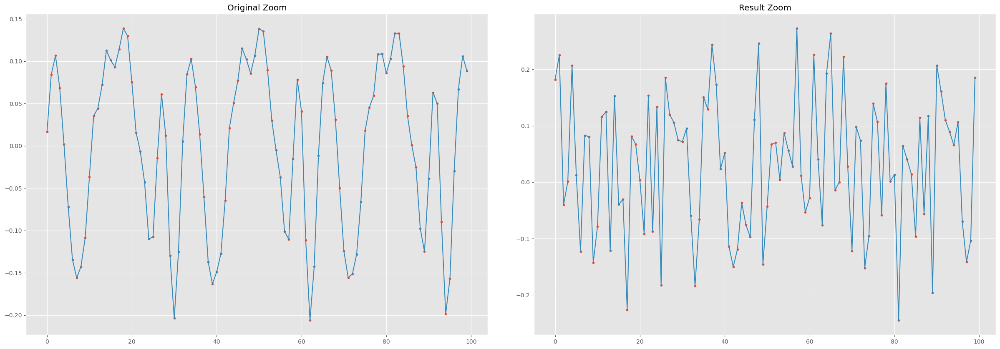

In [15]:
fig      = plt.figure(figsize=(1, 2))
OriginalZ = fig.add_subplot(1, 2, 1)
ResultZ   = fig.add_subplot(1, 2, 2)

OriginalZ.set_title('Original Zoom')
ResultZ.set_title('Result Zoom')

ZoomInit = 40000
ZoomSize = 100

OriginalZ.plot(sample[ZoomInit:ZoomInit+ZoomSize], '.')
OriginalZ.plot(sample[ZoomInit:ZoomInit+ZoomSize], '-')
ResultZ.plot(result[ZoomInit:ZoomInit+ZoomSize], '.')                
ResultZ.plot(result[ZoomInit:ZoomInit+ZoomSize], '-')

plt.gcf().set_size_inches(30, 10)
plt.subplots_adjust(wspace=0.1,hspace=0.3)
plt.show()

fig.savefig(PICTURE_PATH + "AE_CompareZ_" + LABEL + ".png", bbox_inches = "tight")

### Running GAN

1/1 [==============================] - 0s 196ms/step
epoch: 0
Discriminator_loss: 0.685850, Generator_loss: 0.730469
1/1 [==============================] - 0s 45ms/step


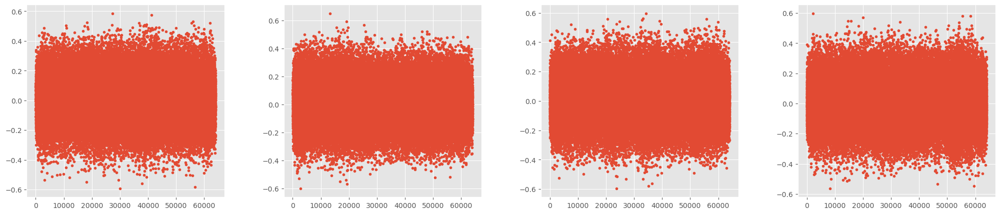

1/1 [==============================] - 0s 60ms/step
epoch: 1
Discriminator_loss: 0.648835, Generator_loss: 0.654775
1/1 [==============================] - 0s 83ms/step
epoch: 2
Discriminator_loss: 0.612032, Generator_loss: 0.741291
1/1 [==============================] - 0s 42ms/step


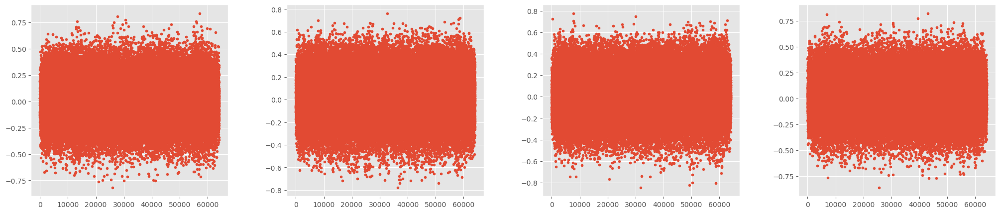

1/1 [==============================] - 0s 84ms/step
epoch: 3
Discriminator_loss: 0.573064, Generator_loss: 0.700984
1/1 [==============================] - 0s 83ms/step
epoch: 4
Discriminator_loss: 0.574877, Generator_loss: 0.706235
1/1 [==============================] - 0s 36ms/step


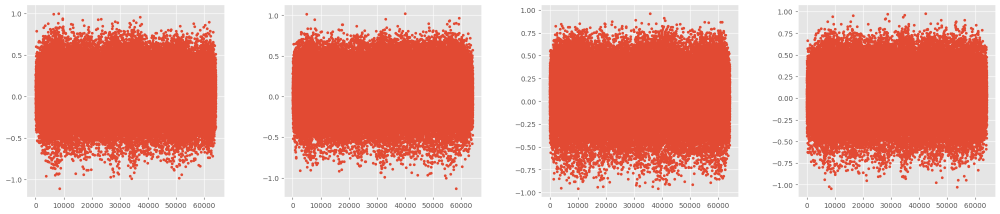

1/1 [==============================] - 0s 85ms/step
epoch: 5
Discriminator_loss: 0.530542, Generator_loss: 0.678995
1/1 [==============================] - 0s 82ms/step
epoch: 6
Discriminator_loss: 0.539547, Generator_loss: 0.673983
1/1 [==============================] - 0s 36ms/step


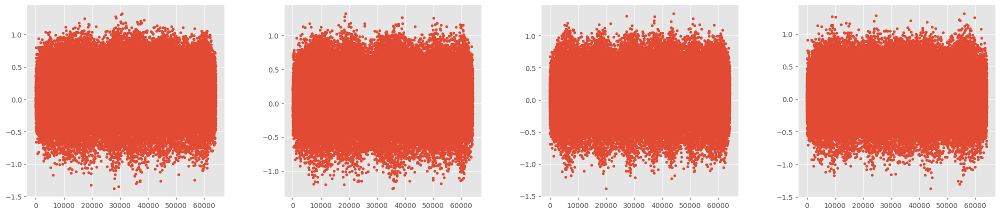

1/1 [==============================] - 0s 75ms/step
epoch: 7
Discriminator_loss: 0.526945, Generator_loss: 0.678585
1/1 [==============================] - 0s 81ms/step
epoch: 8
Discriminator_loss: 0.521881, Generator_loss: 0.683951
1/1 [==============================] - 0s 54ms/step


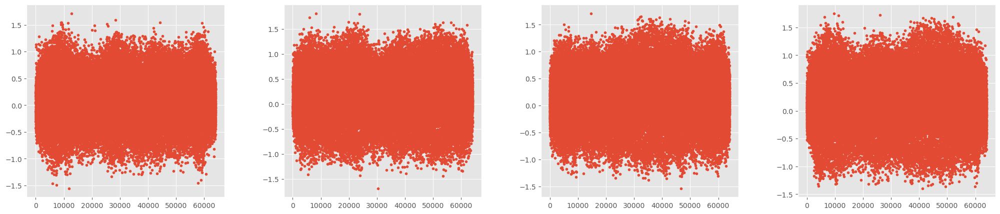

1/1 [==============================] - 0s 65ms/step
epoch: 9
Discriminator_loss: 0.519894, Generator_loss: 0.703875
Execution Time:  20.62 s


In [16]:
start = time.time()
myGan.train_gan(epochs = 10, batch = 32, save_interval = 2)
end = time.time()
total = round(end - start, 2)
print("Execution Time: ", total, "s")

### Discriminator and Generator Loss over Epochs

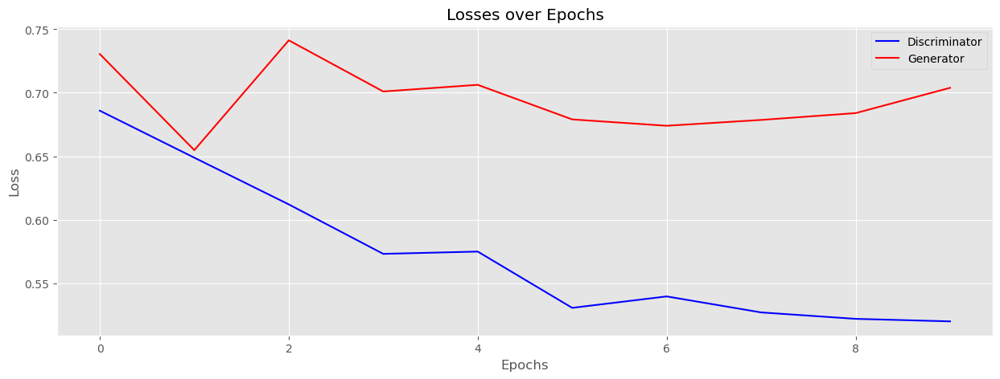

In [17]:
plt.title('Losses over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.plot(myGan.disLossHist, '-', label = 'Discriminator', color = 'blue')
plt.plot(myGan.genLossHist, '-', label = 'Generator',     color = 'red')
plt.legend(loc = 'best')

plt.gcf().set_size_inches(15, 5)
plt.savefig(PICTURE_PATH + "D_G_Loss.png", bbox_inches='tight')
plt.show()

### Test Sample

1/1 [==============================] - 0s 25ms/step


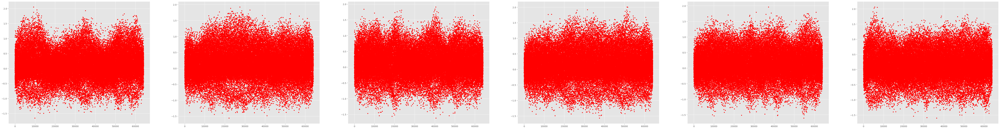

In [18]:
lin, col = 1, 6
fig = plt.figure(figsize=(lin, col))
subPlotS = []
for i in range(lin):
    for j in range(col):
        subPlotS.append(fig.add_subplot(lin , col, (i*col)+j+1))
        
        
for i in range(lin):
    for j in range(col):
        gen_noise = np.random.normal(0, 1, (1,NOISE_DIM))
        gen_test = myGan.gen.predict(gen_noise).flatten()
        #IPython.display.display(ipd.Audio(data=gen_test, rate=SAMPLE_RATE))
        subPlotS[(i*col)+j].plot(gen_test, '.', color='red')



plt.gcf().set_size_inches(80, 10)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()

fig.savefig(PICTURE_PATH + "Generated_"+ LABEL + ".png", bbox_inches='tight')

### Original Samples

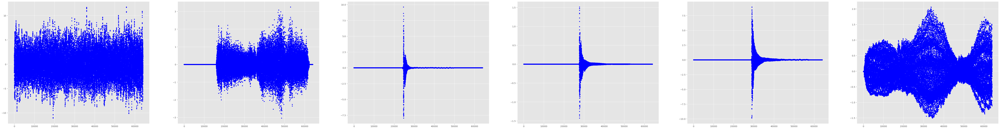

In [19]:
lin, col = 1, 6
fig = plt.figure(figsize=(lin, col))
subPlotS = []
for i in range(lin):
    for j in range(col):
        subPlotS.append(fig.add_subplot(lin , col, (i*col)+j+1))
        
        
for i in range(lin):
    for j in range(col):
        random_index = np.random.randint(0, len(myGan.trainData))
        original = myGan.trainData[random_index]
        #IPython.display.display(ipd.Audio(data=original, rate=SAMPLE_RATE))
        subPlotS[(i*col)+j].plot(original, '.', color='blue')

plt.gcf().set_size_inches(80, 10)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()

fig.savefig(PICTURE_PATH + "Originals_"+ LABEL + ".png", bbox_inches='tight')

### Visualize Conv 1D Filters

#### Discriminator

Filters:  32
Kernel Size:  100
(32, 1, 100)


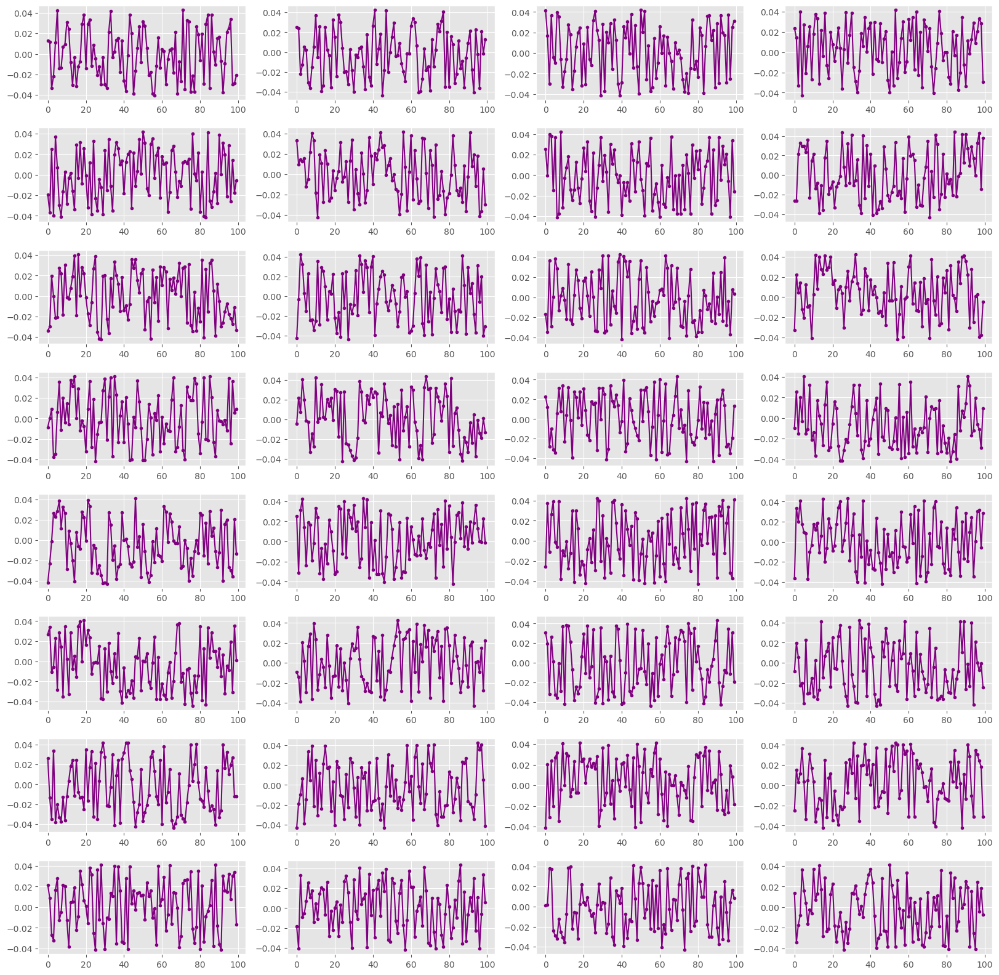

In [20]:
# Obs: lin x col = filters
lin, col = 8, 4

kernelSize = len(myGan.dis.layers[1].get_weights()[0])
filters    = len(myGan.dis.layers[1].get_weights()[0][0][0])

print("Filters: ", filters)
print("Kernel Size: ", kernelSize)

W = myGan.dis.layers[1].get_weights()[0].reshape(filters,1,kernelSize)

print(W.shape)
fig = plt.figure(figsize=(lin, col))
subPlotS = []
for i in range(lin):
    for j in range(col):
        subPlotS.append(fig.add_subplot(lin , col, (i*col)+j+1))
        
layNum = 1     
for i in range(lin):
    for j in range(col):
        convFilter = W[(i*col)+j][0]
        subPlotS[(i*col)+j].plot(convFilter, '.-', color='purple')

plt.gcf().set_size_inches(20, 20)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()

#### Generator

Filters:  16
Kernel Size:  20
(16, 1, 20)


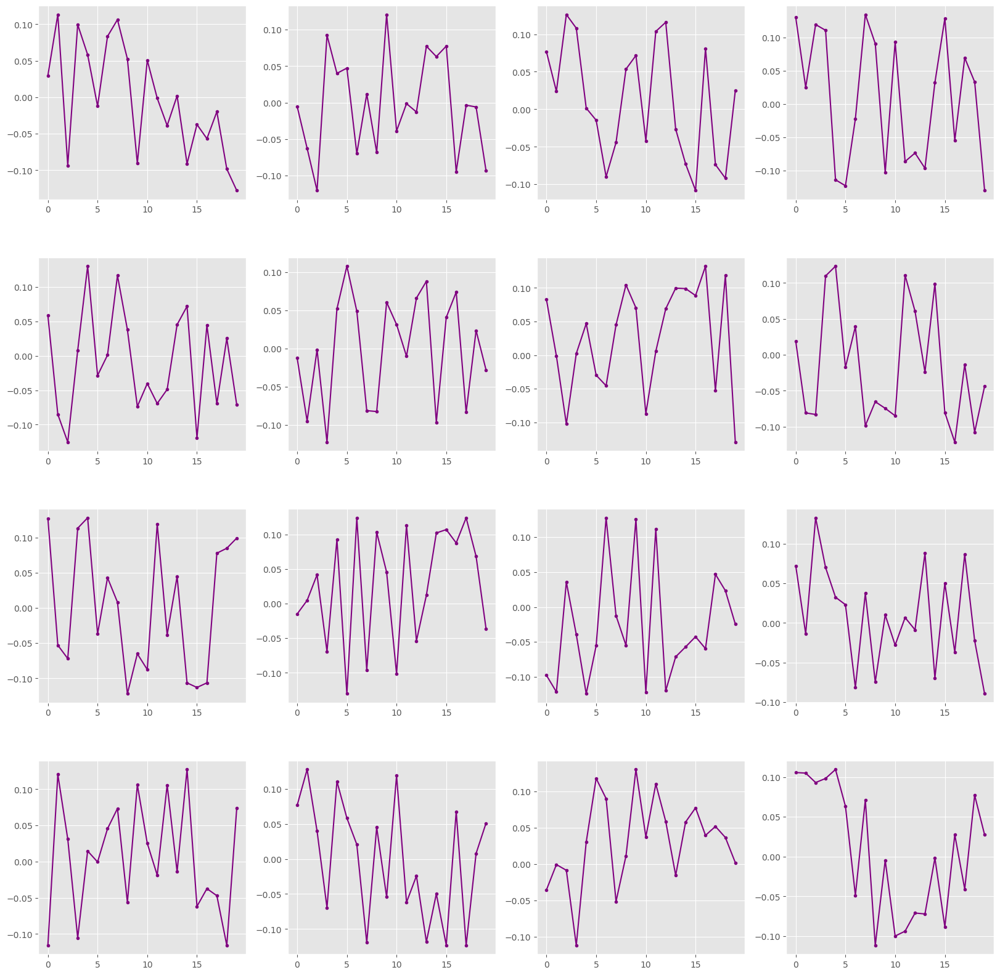

In [21]:
# Obs: lin x col = filters
lin, col = 4, 4

kernelSize = len(myGan.gen.layers[4].get_weights()[0])
filters    = len(myGan.gen.layers[4].get_weights()[0][0][0])

print("Filters: ", filters)
print("Kernel Size: ", kernelSize)

W = myGan.gen.layers[4].get_weights()[0].reshape(filters,1,kernelSize)

print(W.shape)
fig = plt.figure(figsize=(lin, col))
subPlotS = []
for i in range(lin):
    for j in range(col):
        subPlotS.append(fig.add_subplot(lin , col, (i*col)+j+1))
        
layNum = 1     
for i in range(lin):
    for j in range(col):
        convFilter = W[(i*col)+j][0]
        subPlotS[(i*col)+j].plot(convFilter, '.-', color='purple')

plt.gcf().set_size_inches(20, 20)
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()